# 4. Graphing the HMI Wavefunctions
## A. Comparison With LCAO

### Setup code

We have obtained $\Phi(\phi)$, $S(\eta)$, and $R(\xi)$ from previous notebooks. It is now time to combine these functions to plot the entire MO.

As we have successfully obtained the equilibrium internuclear distance in the last notebook, from now on, we fix $D$ to be exactly 2.0.

Below is the code used to create $R(\xi)$ and $S(\eta)$. First, with the pre-calculated energy, $R(\xi)$ can be constructed. During this step, $c^2$ is also obtained. Then, $S(\eta)$ is constructed from the aforementioned $c^2$ and the pre-calculated polynomial expression of $\Lambda(c^2)$. 

In [1]:
import os

import numpy as np
from numpy import polynomial as P 

from scipy.integrate import solve_ivp
from scipy.optimize import fsolve
from scipy.interpolate import interp1d

import matplotlib.pyplot as plt
plt.style.use('default')
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "figure.dpi": 300,
    "savefig.dpi": 300,
    "figure.figsize": [8.0, 5.0]})

# D = 2.0 for the rest of the notebook
D = 2.0

mos = ['1 sigma g', '1 sigma u *']

# n, l, mu
# same as the n, l, abs(m) of the AO of the united atom limit
mo_nums = {
    '1 sigma g': (1, 0, 0),
    '1 sigma u *': (2, 1, 0),
}

mo_E_exact = {
    '1 sigma g': -1.0996287880046224927,
    '1 sigma u *': -0.6674722677043424257,
}

def get_lbda(l, mu):
    """Returns Lambda loaded from file"""
    filename = f"lbda_{l}{mu}.txt"
    filedir = os.path.join(os.path.abspath(''), 
                           'data',
                           'lbda',
                           filename)
    with open(filedir, 'r') as file:
        lbda_coef = np.loadtxt(file)
    lbda = P.Polynomial(lbda_coef) # a function of c2
    return lbda

def get_R(l, mu, E_exact):
    """Returns function R of a particular l, mu, and E_exact"""
    # greater values of l require greater cutoff values
    if l == 0 or l == 1:
        cutoff = 15
    elif l == 2:
        cutoff = 20
    elif l == 3:
        cutoff = 40
    
    c2 = (1/2) * E_exact * (D**2)
    lbda_val = get_lbda(l, mu)(c2)
    
    # initial value of g and g' (at xi = 1)
    q1 = np.array([1,-(2*D + c2 + mu*(mu+1) - lbda_val)/(2*(mu+1))])
    
    # relates g' and g'' with g and g'
    G = lambda xi, q: np.array([[0, 1],
    [-(2*D*xi + c2*(xi**2) + mu*(mu+1) - lbda_val)/(xi**2 - 1),
    -(2*(mu+1)*xi)/(xi**2 - 1)]]) @ q
    
    # solve for g(xi) for 1 < xi <= cutoff
    # exclude xi = 1 to avoid a ZeroDivisionError
    xi_span = np.linspace(1, cutoff, cutoff*100)
    eps = 1e-10
    xi_span[0] = 1.0+eps
    
    sol = solve_ivp(G, [1.0 + eps, cutoff], q1, t_eval=xi_span)
    
    # calculate R from g
    R_vals = ((xi_span ** 2 - 1)**(mu/2)) * sol.y[0]
    
    # add back xi = 0 and R(xi) = 0 or 1 depending on mu
    xi_span[0] = 1.0
    R_vals[0] = 1.0 if mu == 0 else 0.0
    
    R_interp = interp1d(xi_span, R_vals, kind='quadratic')
    
    # NOTE: xi greater than cutoff should result in R = 0
    # to be implemented with functions down the line
    return R_interp, cutoff

def get_S(l, mu, E_exact):
    """Returns function S of a particular l, mu, and E_exact"""
    # evenness determined by 
    # the number of angular nodes between the two nuclei
    # excluding angular nodes that contain the internuclear axis
    is_even = True if (l - mu) % 2 == 0 else False
    
    c2 = (1/2) * E_exact * (2.0**2)
    lbda_val = get_lbda(l, mu)(c2)

    p1 = np.array([1, ((mu*(mu+1) + c2 - lbda_val)/(2*(mu+1)))])

    F = lambda eta, p: np.array([[0, 1], 
    [(mu*(mu+1) - lbda_val + c2*(eta**2))
     /(1 - eta**2), 2*(mu+1)*eta/(1 - eta**2)]]) @ p
    
    # obtain values of f(eta) along these points
    # we exclude eta=1 to avoid a ZeroDivisionError    
    eta_span = np.linspace(1, 0, 100)
    eps = 1.0e-10 # a very small value
    eta_span[0] = 1.0-eps

    # solve using solve_ivp, sol.y[0] is f(eta_span) 
    # and sol.y[1] is f'(eta_span)
    sol = solve_ivp(F, [1 - eps, 0], p1, t_eval=eta_span)

    # we are plotting S(eta), not f(eta)
    S_vals = ((1 - eta_span**2) ** (mu/2)) * sol.y[0]

    # add back S_val(1) to eta_span
    S_vals[0] == 1 if mu == 0 else 0
    
    # using symmetry to construct S(eta) for -1 <= eta < 0
    if is_even:
        S_vals = np.concatenate([S_vals[:-1], S_vals[::-1]])
    else:
        S_vals = np.concatenate([-S_vals[:-1], S_vals[::-1]])
    
    return interp1d(np.linspace(-1.0, 1.0, 199), 
                    S_vals, kind='quadratic')

### Bonding and antibonding MOs

For $1 \sigma_g$ and $1 \sigma_u^*$, the $\phi$-dependent part is a constant function. Therefore, $\psi(\xi, \eta, \phi) = A\,R(\xi)S(\eta)$ for some normalization constant $A$. As the volume element is $dV = \left (\xi^2 - \eta^2 \right ) d\xi \, d\eta \, d\phi$ for $D = 2.0$, We can obtain the normalization constant through the following integrals (note that we are dealing with a real-valued wavefuntion).

$$1 = \int_{0}^{2\pi}\int_{-1}^{1}\int_{1}^{\infty} A^2 \left ( R(\xi) \right )^2 \left ( S(\eta) \right )^2 \left (\xi^2 - \eta^2 \right ) d\xi \, d\eta \, d\phi$$

$$= 2\pi A^2  \int_{-1}^{1}\int_{1}^{\infty} \left ( R(\xi) \right )^2 \left ( S(\eta) \right )^2 \left (\xi^2 - \eta^2 \right ) d\xi \, d\eta$$

Therefore, 
$$\frac{1}{2\pi A^2}=  \left \{ \int_{-1}^{1} \left ( S(\eta) \right )^2 d\eta \int_{1}^{\infty} \xi^2 \left ( R(\xi) \right )^2  d\xi - \int_{-1}^{1} \eta^2 \left ( S(\eta) \right )^2 d\eta \int_{1}^{\infty} \left ( R(\xi) \right )^2  d\xi \right \}$$

These integrals are calculated numerically with `scipy.integrated.simpson`.

Using the integral above, a contour plot of the wavefunction along the xz-plane can be drawn.

In [2]:
# for mu = 0 only

# Simpson's rule for fast integration
from scipy.integrate import simpson

# cross section of exact MO, along the xz-plane
# mu = 0, l = 0 (bonding) or 1 (antibonding)
def get_mo_cs(l):
    if l == 0:
        E_exact = mo_E_exact['1 sigma g']
    else:
        E_exact = mo_E_exact['1 sigma u *']
    R, cutoff = get_R(l, 0, E_exact)
    S = get_S(l, 0, E_exact)

    # R * S needs to be normalized
    # volume element = (xi**2 - eta**2) * d xi * d eta * d phi
    # integration with phi yields normalization constant of 1/sqrt(2*pi)
    
    # note: simpson requires even number of intervals (odd number of samples)
    eta_span = np.linspace(-1.0, 1.0, 101)
    S2_int = simpson(S(eta_span)**2, x=eta_span)
    eta2_S2_int = simpson((eta_span*S(eta_span))**2, x=eta_span)
    
    xi_span = np.linspace(1.0, cutoff, cutoff*50+1)
    R2_int = simpson(R(xi_span)**2, x=xi_span)
    xi2_R2_int = simpson((xi_span*R(xi_span))**2, x=xi_span)

    # norm_const = 1/A in the equation above
    norm_const = np.sqrt(2*np.pi*(S2_int*xi2_R2_int - eta2_S2_int*R2_int))
    
    # takes cartesian coordinates
    def mo_returned(x, z):
        # distances from nucleus A and B
        rA = np.sqrt(x**2 + (z + 1.0)**2)
        rB = np.sqrt(x**2 + (z - 1.0)**2)
        
        xi = (rA + rB)/2.0
        eta = (rA - rB)/2.0
        
        # check for bounds
        if xi < 1.0:
            xi = 1.0
        
        if eta < -1.0:
            eta = -1.0
        elif eta > 1.0:
            eta = 1.0
        
        # because we work with sigma orbitals only,
        # we do not deal with phi here

        # xi > cutoff -> R = 0 implemented here
        if xi > cutoff:
            return 0
        else:
            return (R(xi)*S(eta))/norm_const

    return mo_returned

In our previous discussion of LCAO-MO, we have yet to normalize the actual LCAO-MOs. The normalization constants are derived fairly easily, and they are as follows.

$$1 \sigma_{g} \approx \sigma_{g1s} = \frac{1}{\sqrt{2\left ( 1+S \right )}} \left ( 1s_{A} + 1s_{B} \right )$$

$$1 \sigma_{u}^{*} \approx \sigma_{u1s}^{*} = \frac{1}{\sqrt{2\left ( 1-S \right )}} \left ( 1s_{A} - 1s_{B} \right )$$

where $S$ is the overlap integral:

$$S(D) = e^{-D}\left ( 1 + D + \frac{D^2}{3} \right )$$

In [3]:
# cross section of LCAO-MO, evaluated only on the xz-plane
# mu = 0, l = 0 (bonding) or 1 (antibonding)
def get_lcao_cs(l):
    # 1s orbital, function of r only
    s_orbital = lambda r: np.exp(-r)/np.sqrt(np.pi)
    
    # cartesian coordinates
    def lcao_returned(x, z, l):
        rA = np.sqrt(x**2 + (z + 1.0)**2)
        rB = np.sqrt(x**2 + (z - 1.0)**2)

        # normalization constants are from literature
        S_D = np.exp(-2.0) * (1 + 2.0 + (2.0**2)/3)
        if l == 0: # bonding
            return (s_orbital(rB)+s_orbital(rA))/np.sqrt(2 * (1 + S_D))
        else: # antibonding
            return (s_orbital(rB)-s_orbital(rA))/np.sqrt(2 * (1 - S_D))

    return lambda x, z: lcao_returned(x, z, l)

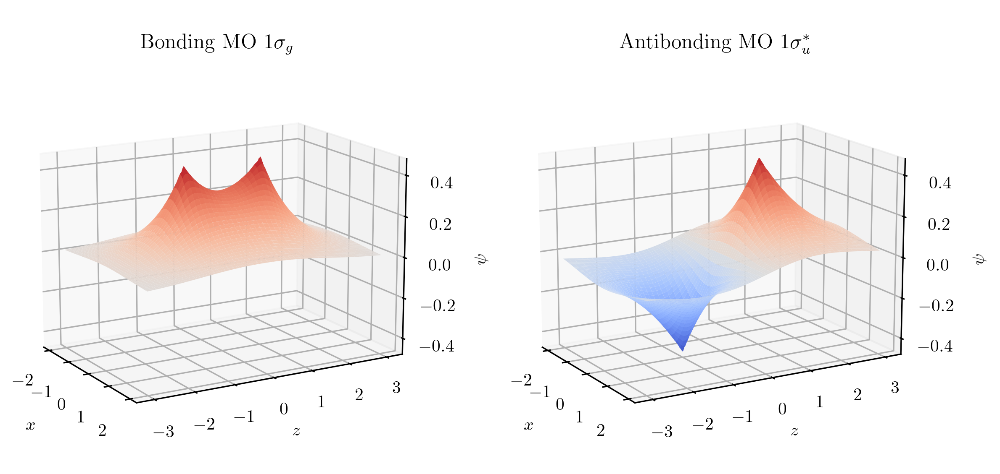

In [4]:
# exact MOs
exact_mos = [
    get_mo_cs(0),
    get_mo_cs(1),
]

# LCAO-MOs
lcao_mos = [
    get_lcao_cs(0),
    get_lcao_cs(1),
]


# plotting 3D surface plots
from matplotlib import cm

fig, axes = plt.subplots(1, 2, 
                         subplot_kw={"projection":'3d'}, 
                         figsize=(12.0, 4.0))
plt.tight_layout()
plt.subplots_adjust(top=0.9, 
                    bottom=0.1, 
                    left=0.1, 
                    right=0.9,
                    wspace=-0.3)

for l, mo in enumerate(mos):
    mo_cs = np.vectorize(exact_mos[l])
    
    X = np.linspace(-2.0, 2.0, 300)
    Z = np.linspace(-3.0, 3.0, 300)
    X, Z = np.meshgrid(X, Z)
    PSI = mo_cs(X, Z)
    axes[l].plot_surface(X, Z, PSI, 
                         cmap=cm.coolwarm, vmin=-0.46, vmax=0.46)
    axes[l].set_xlabel('$x$')
    axes[l].set_ylabel('$z$')
    axes[l].set_zlabel('$\psi$')
    axes[l].set_zlim(-0.46, 0.46)
    axes[l].set_box_aspect((2, 3, 2.0))
    axes[l].view_init(elev=15, azim=-30)
    axes[l].set_facecolor((0, 0, 0, 0))
    
axes[0].set_title('\n' + r'Bonding MO $1 \sigma_g$')
axes[1].set_title('\n' + r'Antibonding MO $1 \sigma_u^*$');

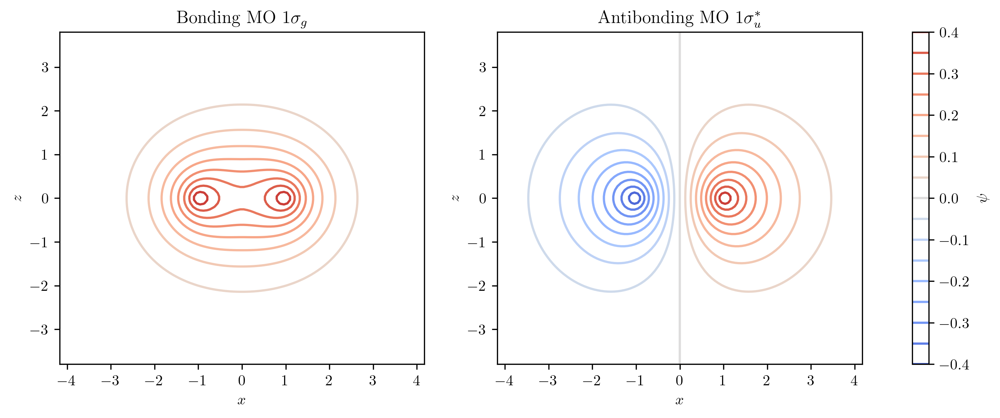

In [5]:
# contour plot
fig, axes = plt.subplots(1, 2,  
                         figsize=(12.0, 4.0))
"""
plt.tight_layout()
plt.subplots_adjust(top=0.9, 
                    bottom=0.1, 
                    left=0.1, 
                    right=0.9,
                    wspace=-0.3)
"""

for l, mo in enumerate(mos):
    mo_cs = np.vectorize(exact_mos[l])
    
    X = np.linspace(-3.8, 3.8, 100)
    Z = np.linspace(-3.8, 3.8, 100)
    X, Z = np.meshgrid(X, Z)
    PSI = mo_cs(X, Z)
    contour = axes[l].contour(Z, X, PSI, np.linspace(-0.4, 0.4, 17),
                              cmap=cm.coolwarm, vmin=-0.46, vmax=0.46)
    axes[l].axis('equal')
    axes[l].set_xlabel('$x$')
    axes[l].set_ylabel('$z$')
    axes[l].set_xlim(-3.8, 3.8)
    axes[l].set_xticks(list(np.linspace(-4.0, 4.0, 9)))
    
axes[0].set_title(r'Bonding MO $1 \sigma_g$')
axes[1].set_title(r'Antibonding MO $1 \sigma_u^*$');

cb = fig.colorbar(contour, ax=axes.ravel().tolist())
cb.set_label(r'$\psi$')
cb.set_ticks(list(np.linspace(-0.4, 0.4, 9)))

Values of the exact-MO and its LCAO-MO counterpart, calculated along the internuclear axis, are plotted below for comparison.

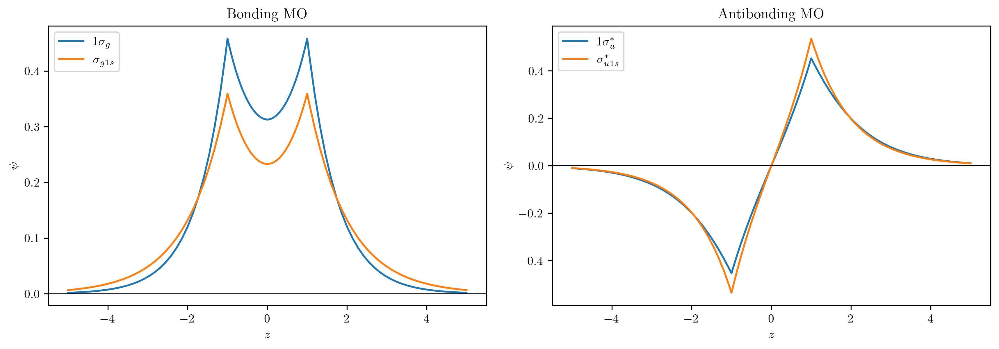

In [6]:
mo_latex = [
    r"$1 \sigma_{g}$",
    r"$1 \sigma_{u}^{\ast}$",
]

lcao_latex = [
    r"$\sigma_{g1s}$",
    r"$\sigma_{u1s}^{\ast}$",
]

z_span = np.concatenate([
    np.linspace(-5, -1.05, 30),
    np.linspace(-1.05, -0.95, 30),
    np.linspace(-0.95, 0, 30)], 
    axis=0)

fig, axes = plt.subplots(1, 2, figsize=(12.0, 4.0))
plt.tight_layout()
plt.subplots_adjust(top=0.9, 
                    bottom=0.1, 
                    left=0.05, 
                    right=0.95,
                    wspace=0.15)

for l in range(2):
    if l == 0:
        sign = +1.0
    else:
        sign = -1.0
    mo_z = np.vectorize(lambda z: exact_mos[l](0, z))
    mo_phi = mo_z(z_span)
    p = axes[l].plot(z_span, mo_phi, label=mo_latex[l])
    axes[l].plot(-z_span, sign*mo_phi, color=p[0].get_color())
    
    lcao_z = np.vectorize(lambda z: lcao_mos[l](0, z))
    lcao_phi = lcao_z(z_span)
    p = axes[l].plot(z_span, lcao_phi, label=lcao_latex[l])
    axes[l].plot(-z_span, sign*lcao_phi, color=p[0].get_color())
    
    axes[l].set_xlabel('$z$')
    axes[l].set_ylabel(r'$\psi$')
    axes[l].legend(loc=2)
    axes[l].axhline(y=0, color='k', linewidth=0.5)

axes[0].set_title(r'Bonding MO')
axes[1].set_title(r'Antibonding MO');

For the bonding MOs, the exact-MO has a larger amplitude than the LCAO-MO at the middle, which results in a higher electron density between the two nuclei. This is to be expected as the exact-MO takes account for the attraction of the electron from the two nuclei simultaneously, while LCAO-MO somewhat averages the two attraction. 

As a result, the exact MO has a lower $E_{tot}$ than the LCAO-MO (due to the increased electron density), and the exact-MO has a smaller $D_e$ (as the electron shields the repulsion between the two nuclei better). A similar analysis can be made for the antibonding MOs.

### The Shapes of Orbitals

Here, we finally investigate the exact-MOs themselves, in glorious 3D. There are two ways of representing orbitals implemented below.

The first is a 3D scatterplot, where the density of dots is directly proportional to the electron (probability) density $\left | \psi \right |^2$. The color of the dot represents the sign (phase to be more technical) of the wavefunction $\psi$ at that point - red is positive, blue is negative.

Second is a 3D plot of the contour surface of $\left | \psi \right |^2$. More specifically, it is the isosurface of $\left | \psi \right |^2$ that encompasses a volume in which the electron will be found 90% of the time. The color coding is the came with the 3D scatter plot.

Both 3D plots are implemented in the same way by the following procedure. A python script generates data (collection of points or a mesh surface), which is then saved to disk. Another python script is used to generate the graph shown in this notebook.

### Scatterplots

| $1 \sigma_{g}$ | $1 \sigma_{u}^{\ast}$ | $1 \pi_{u}$ | $2 \sigma_{g}$ |
|:-:|:-:|:-:|:-:|
| ![s1](img/s1.png) | ![s2](img/s2.png) | ![s3](img/s3.png) | ![s4](img/s4.png) |

| $3 \sigma_{g}$ | $2 \sigma_{u}^{*}$ | $1 \pi_{g}^{*}$ | $3 \sigma_{u}^{*}$ |
|:-:|:-:|:-:|:-:|
| ![s5](img/s5.png) | ![s6](img/s6.png) | ![s7](img/s7.png) | ![s8](img/s8.png) |

In [7]:
## view plot_scatterplot.py
from plot_scatterplot import plot_scatterplot
plot_scatterplot()

### Isosurfaces

| $1 \sigma_{g}$ | $1 \sigma_{u}^{\ast}$ | $1 \pi_{u}$ | $2 \sigma_{g}$ |
|:-:|:-:|:-:|:-:|
| ![i1](img/i1.png) | ![i2](img/i2.png) | ![i3](img/i3.png) | ![i4](img/i4.png) |

| $3 \sigma_{g}$ | $2 \sigma_{u}^{*}$ | $1 \pi_{g}^{*}$ | $3 \sigma_{u}^{*}$ |
|:-:|:-:|:-:|:-:|
| ![i5](img/i5.png) | ![i6](img/i6.png) | ![i7](img/i7.png) | ![i8](img/i8.png) |

In [8]:
# view plot_scatterplot.py
from plot_isosurface import plot_isosurface
plot_isosurface()